# TIME SERIES ANALYSIS

# Goal: Find outliers, trends and periodicity in the MTA turnstile data
    

## DATA:
MTA subway fares. It is a complete dataset of
rides logged by card swipes for 600 Manhattan stations.

The data was organized  by Sina Kashuk at CUSP (he will teach the Geopanda lecture).
You can get it from the github repo (use the download link to download it live in your notebook). 
It contains 23 different subway card types 
(e.g. monthly pass, daily pass, Act for Disability pass…) as follows:


In [2]:
from IPython.display import Image
#Image(filename = "Ridetypes.png")

## Each time series (per station, per ticket type) contains the number of swipes per week for 194 weeks from 05/21/2010 to 02/21/2014. 

The data are available to you as a *python data cube*. you can load it as 

```
np.load(“MTA_Fare.npy")
```

and you will end up with a python numpy array of 
shape (600, 23, 194)

## note that the missing values are inputted as -1

if you want to do things like algebra (summing time series for example) you need to take care of that. If you replace the -1 entries with NaN, you may need to use functions that explicitly know how to deal with NaN: for example, to sum use the no.nansum etc
```
np.nanmean(mtarides)
np.nansum(mtarides)
```


as opposed to just 

use the no.nansum etc
```
np.mean(mtarides)
np.sum(mtarides)
```

In [10]:
import numpy as np
import pandas as pd
import pylab as pl
%pylab inline

Populating the interactive namespace from numpy and matplotlib


## Task 1: 
### Event detection: Identify the most prominent event. There is a very significant drop (>3-sigma) in all time series.
### Identify it, figure out the date (you know when the data starts and what the cadence is) and figure out what it is due to.

In [6]:
timeseries = np.load("MTA_Fare.npy")

In [7]:
ridesDate = pd.date_range(start='05/28/2010', end='02/07/2014', freq='W-Fri')

In [8]:
timeseries = timeseries.astype('float')

In [9]:
timeseries[timeseries == -1] = np.nan

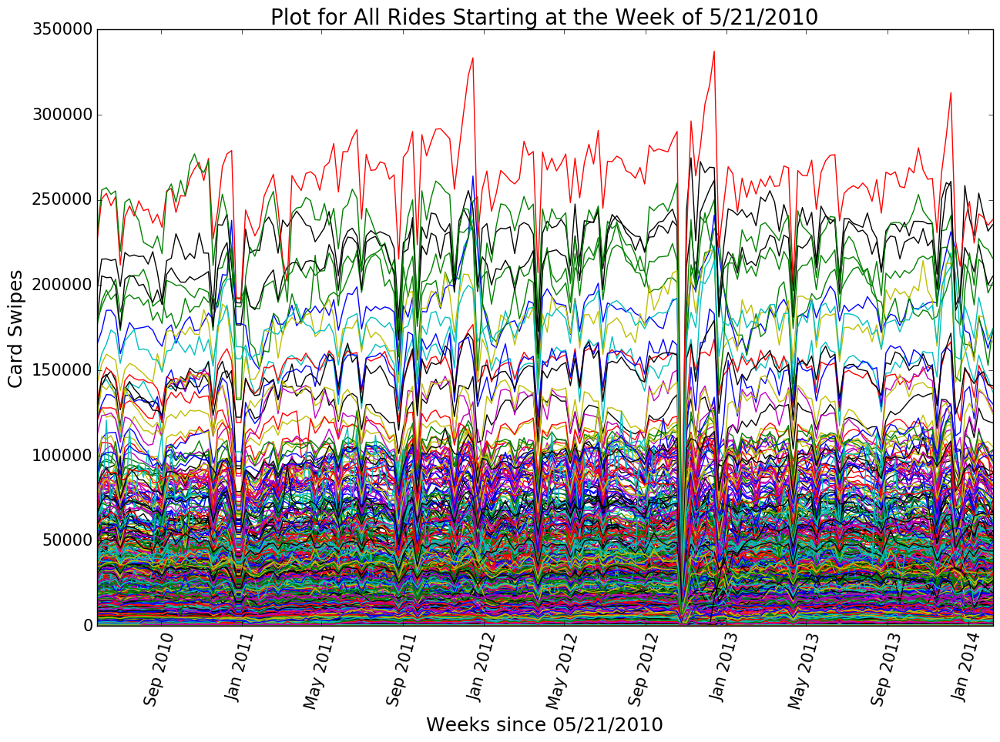

In [12]:
pl.figure(figsize=(15,10))
for i in arange(len(timeseries)):
    for j in arange(len(timeseries[i])):
        pl.plot(ridesDate, timeseries[i][j])
pl.xlabel('Weeks since 05/21/2010', fontsize = 18)
pl.ylabel('Card Swipes', fontsize = 18)
pl.xticks(rotation=75, fontsize=15)
pl.yticks(fontsize=15)
pl.title('Plot for All Rides Starting at the Week of 5/21/2010', fontsize = 20)

In [13]:
station_sum = np.nansum(timeseries, axis=0)
station_mean = np.nanmean(timeseries, axis=0)
card_sum = np.nansum(timeseries, axis=1)
card_mean = np.nanmean(timeseries, axis=1)
all_sum = np.nansum(card_sum, axis=0)

/opt/rh/anaconda/root/envs/PUI2016_Python2/lib/python2.7/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


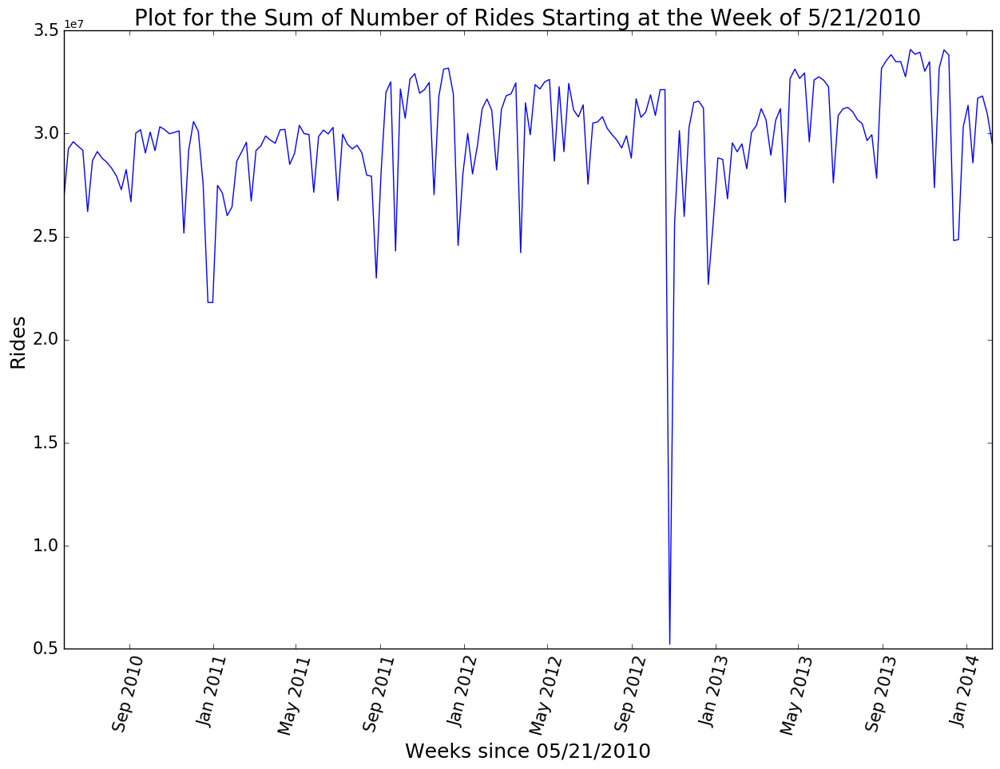

In [15]:
pl.figure(figsize=(15,10))
pl.plot(ridesDate, all_sum)
pl.xlabel('Weeks since 05/21/2010', fontsize=18)
pl.ylabel('Rides', fontsize=18)
pl.xticks(rotation=75, fontsize=15)
pl.yticks(fontsize=15)
pl.title('Plot for the Sum of Number of Rides Starting at the Week of 5/21/2010', fontsize=20)

In [18]:
all_mean = np.nanmean(all_sum)
all_sd = np.nanstd(all_sum)
thres = [all_mean + 3 * all_sd, all_mean - 3 * all_sd]
print ("Average Number of Rides: {:}".format(int(all_mean)))
print ("std of Number of Rides: {:}".format(int(all_sd)))
print ("3-Sigma Thresholds {:.2f} {:.2f}".format(*thres))
#print ("Data Starting from", min(ridesDate))

Average Number of Rides: 29781349
std of Number of Rides: 2983960
3-Sigma Thresholds 38733231.14 20829468.61


In [25]:
outliers = ridesDate[((all_sum > thres[0]) | (all_sum < thres[1]))]
print(outliers.values[0])

2012-10-26T00:00:00.000000000


### We can identify there is a drop between Sep. 2012 and Jan 2013 and the outlier is on 2012-10-26


## Task 2: 
### Some of the time series are stationary, some have a complex structure, some show a downward trend: Identify the **ridership types**  that have steadily increased in popularity,  and that have steadily decreased. by how much? (e.g what is the ratio of usage in the first 10 and last 10 weeks)

In [28]:
cardtype = ['10T', '14D', '1D', '2T', '30D', '7D', 'ADA', 'AFAS',
                     'EXP','EZ','FF','MC','MR','MTHLY','RFM','RR','SEN',
                     'SPEC','TCMC','TKT','UNL','XBUS','STUD']

df1 = pd.DataFrame()
for i in arange(len(cardtype)):
    df1[cardtype[i]] = station_mean[i]
df1['Date'] = pd.DataFrame(ridesDate)

/opt/rh/anaconda/root/envs/PUI2016_Python2/lib/python2.7/site-packages/ipykernel/__main__.py:2: FutureWarning: pd.rolling_mean is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(window=10,center=False).mean()
  from ipykernel import kernelapp as app


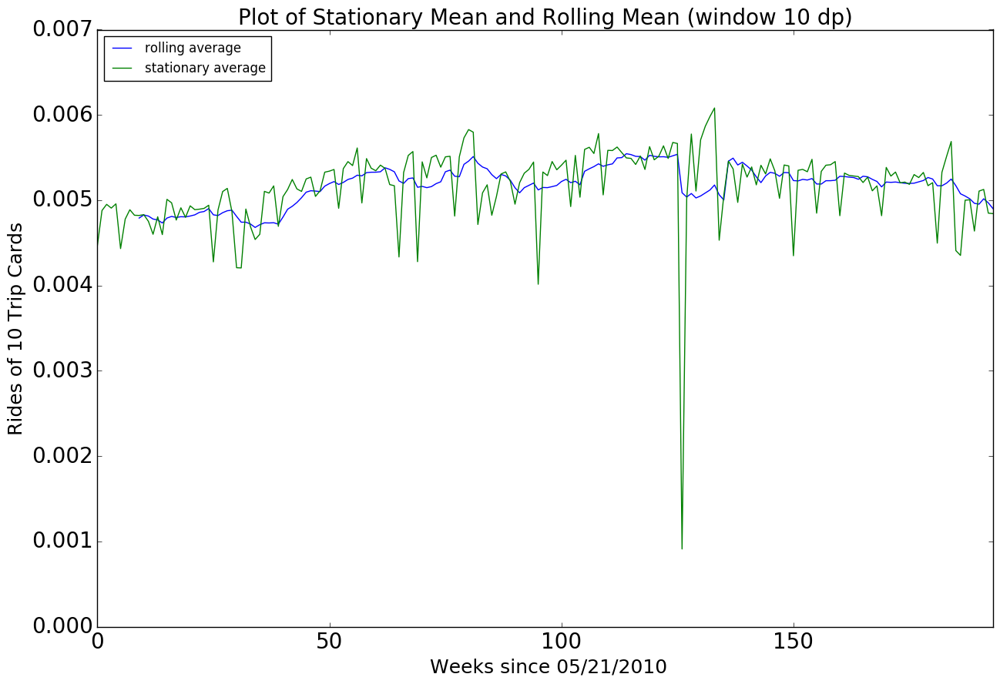

In [30]:
fig = pl.figure(figsize=(15,10))
ax = pd.rolling_mean(df1['10T']/df1['10T'].sum(), 10).plot(fontsize=20, label = "rolling average")
ax.set_title("Plot of Stationary Mean and Rolling Mean (window 10 dp)", fontsize=20)
pl.xlabel(' Weeks since 05/21/2010', fontsize = 18)
pl.ylabel('Rides of 10 Trip Cards', fontsize = 18)
ax.plot(df1['10T']/df1['10T'].sum(), label = "stationary average")
pl.legend(loc = 2)

/opt/rh/anaconda/root/envs/PUI2016_Python2/lib/python2.7/site-packages/ipykernel/__main__.py:2: FutureWarning: pd.rolling_std is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(window=10,center=False).std()
  from ipykernel import kernelapp as app


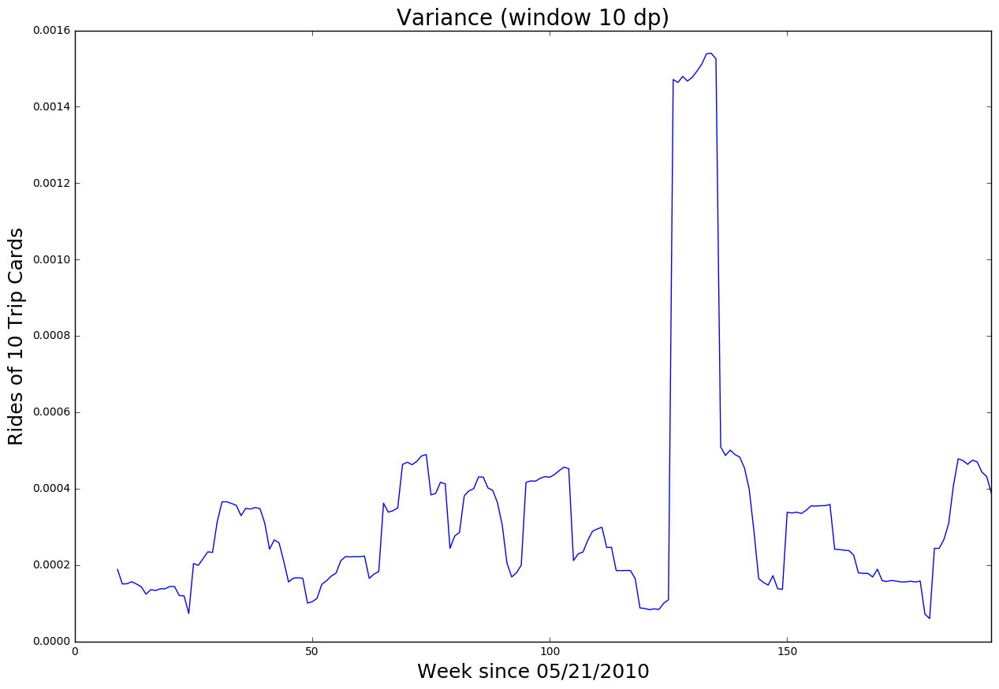

In [32]:
fig = pl.figure(figsize=(15,10))
ax = pd.rolling_std(df1['10T']/df1['10T'].sum(), 10).plot()
ax.set_title("Variance (window 10 dp)", fontsize=20)
pl.xlabel("Week since 05/21/2010", fontsize=18)
pl.ylabel("Rides of 10 Trip Cards", fontsize=18)

/opt/rh/anaconda/root/envs/PUI2016_Python2/lib/python2.7/site-packages/ipykernel/__main__.py:3: FutureWarning: pd.rolling_mean is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(window=10,center=False).mean()
  app.launch_new_instance()
/opt/rh/anaconda/root/envs/PUI2016_Python2/lib/python2.7/site-packages/ipykernel/__main__.py:13: FutureWarning: pd.rolling_std is deprecated for DataFrame and will be removed in a future version, replace with 
	DataFrame.rolling(window=10,center=False).std()
/opt/rh/anaconda/root/envs/PUI2016_Python2/lib/python2.7/site-packages/matplotlib/pyplot.py:516: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


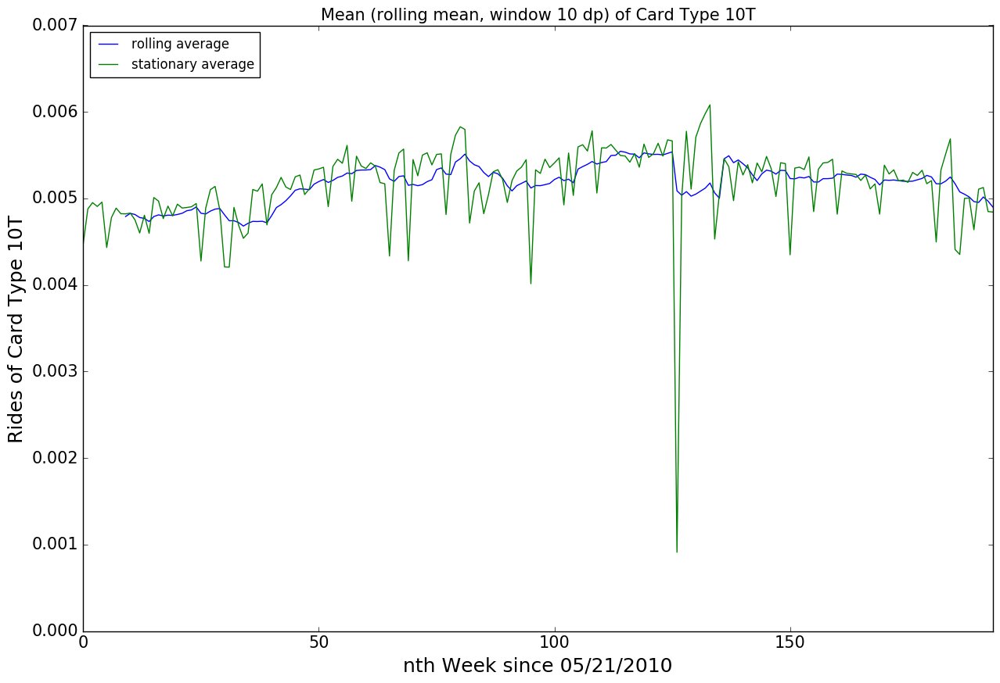

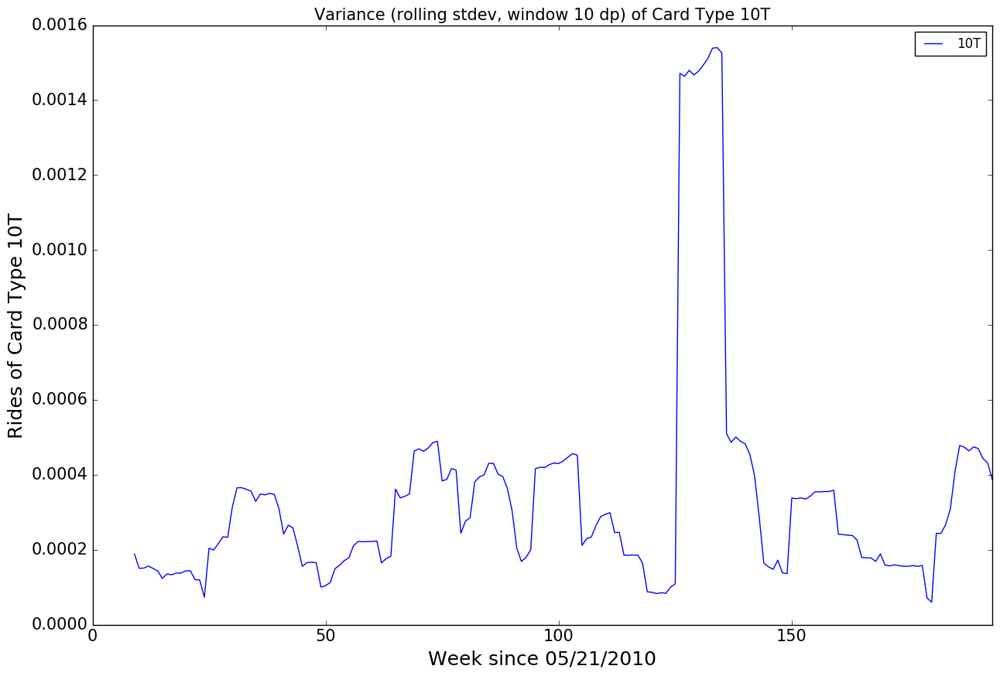

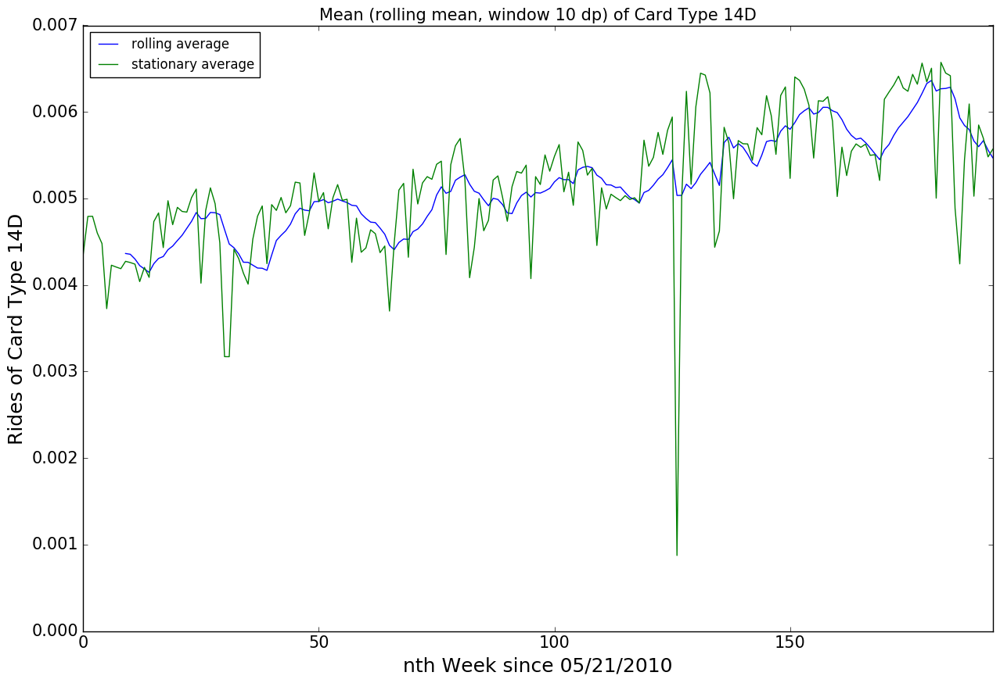

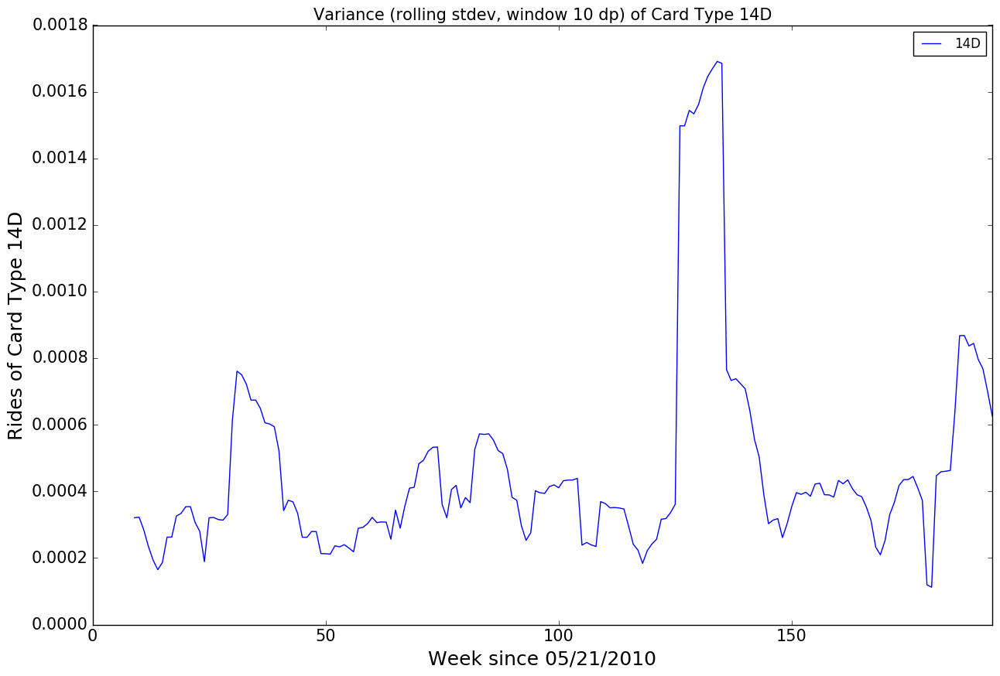

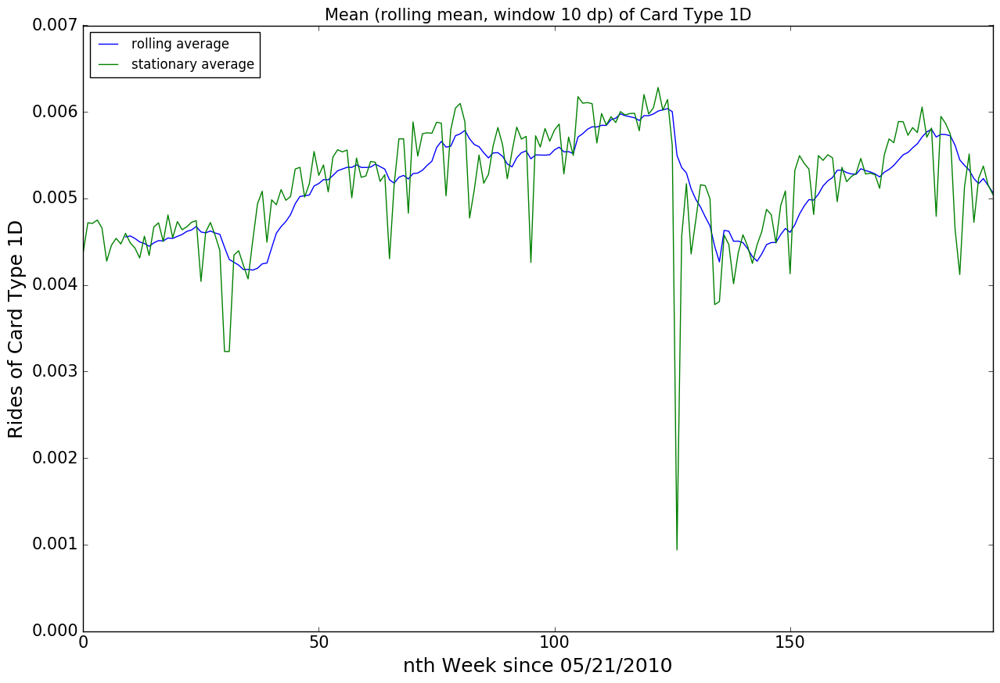

...

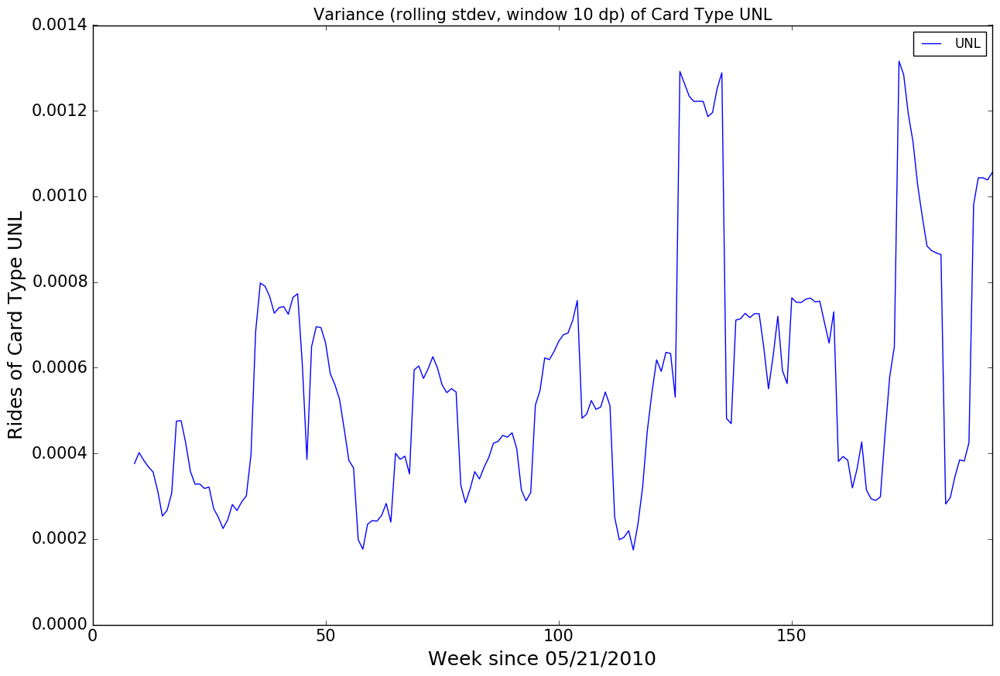

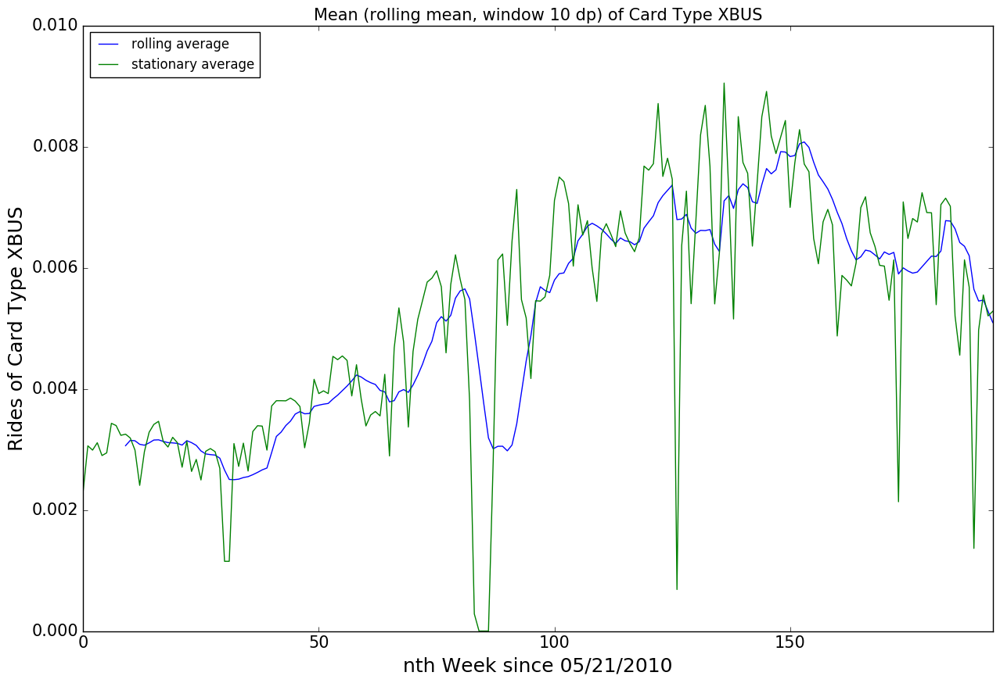

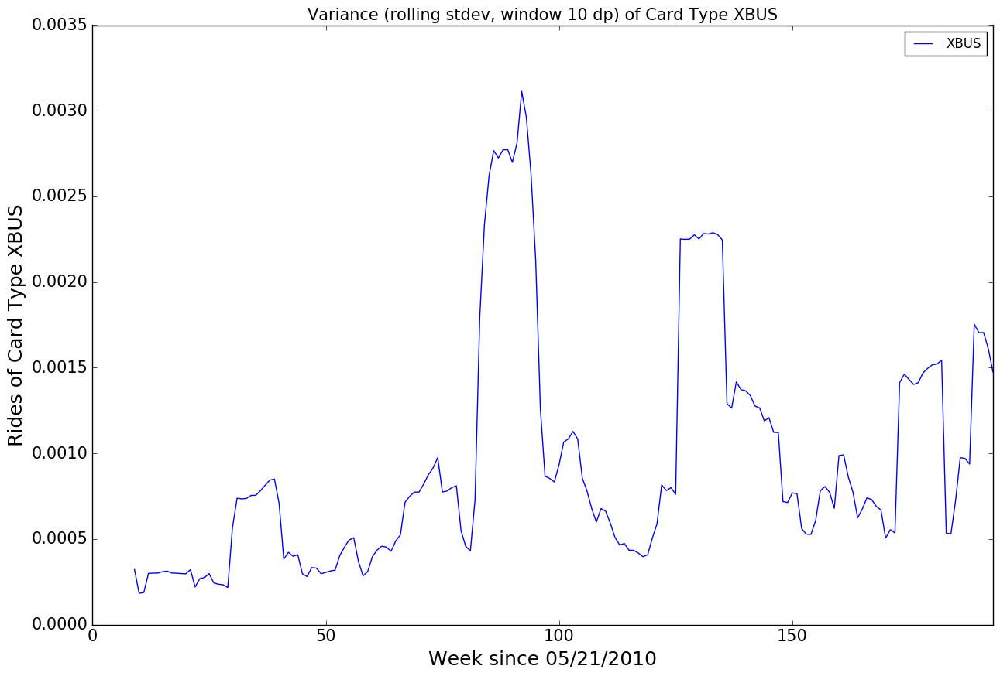

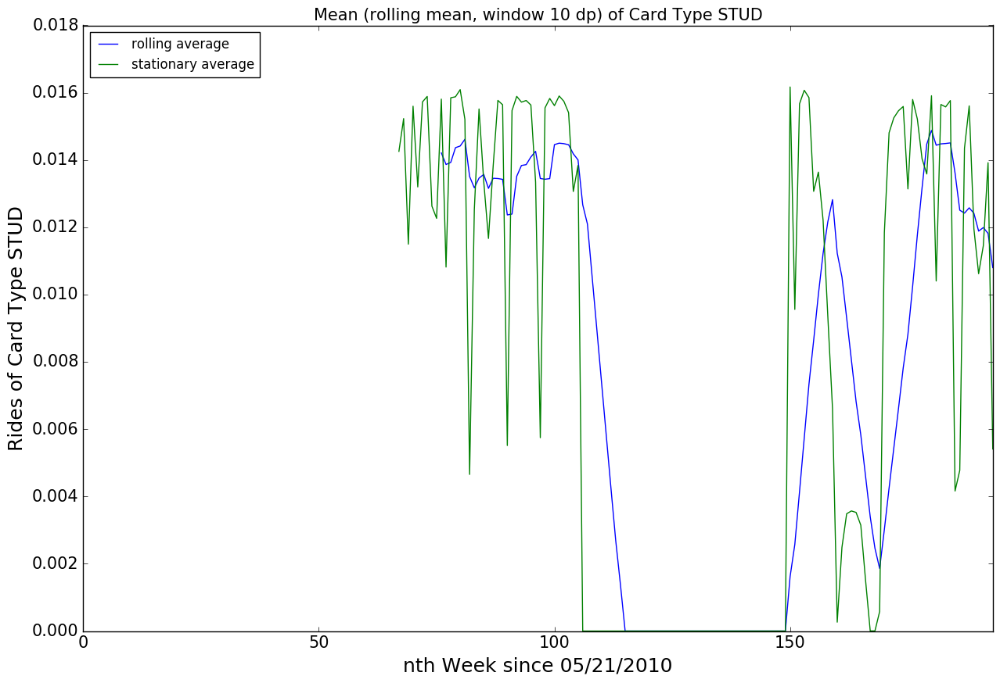

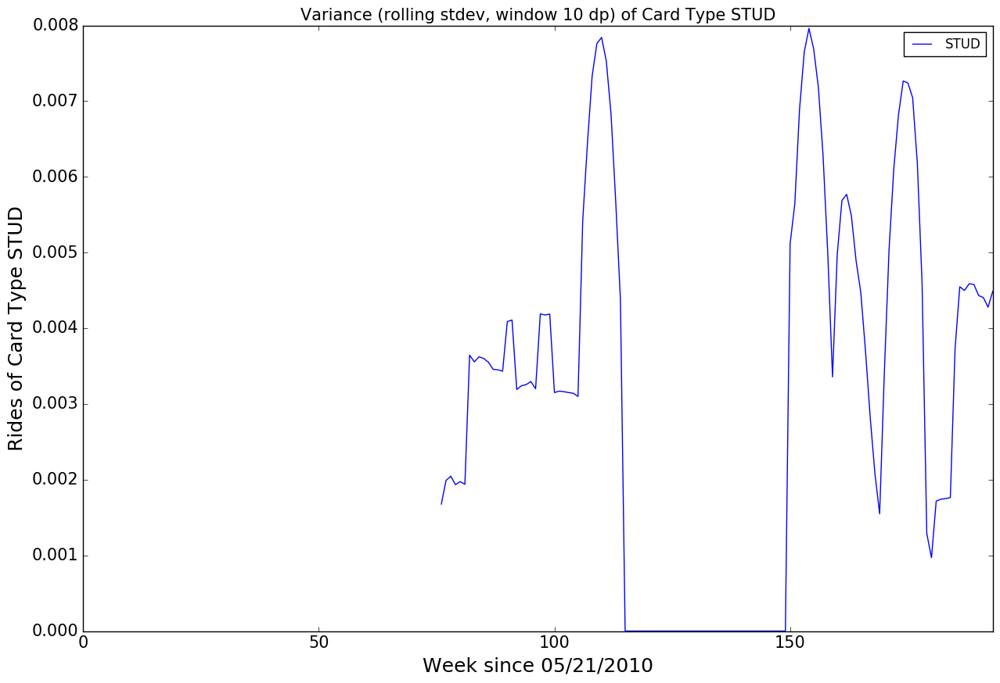

In [34]:
for i in cardtype:   
    fig = pl.figure(figsize=(15,10))
    ax = pd.rolling_mean(df1[i]/df1[i].sum(), 10).plot(figsize=(15,10), fontsize=20, label = "rolling average")
    ax.set_title("Mean (rolling mean, window 10 dp) of Card Type %s" % i, fontsize=15)
    pl.xlabel("nth Week since 05/21/2010", fontsize=18)
    pl.ylabel(("Rides of Card Type %s" % i), fontsize=18)
    pl.xticks(fontsize = 15)
    pl.yticks(fontsize = 15)
    ax.plot(df1[i]/df1[i].sum(), label="stationary average")
    pl.legend(loc = 2)
    
    fig = pl.figure(figsize=(15,10))
    ax = pd.rolling_std(df1[[i]]/df1[[i]].sum(), 10).plot(figsize=(15,10))
    ax.set_title("Variance (rolling stdev, window 10 dp) of Card Type %s" % i, fontsize=15)
    pl.xlabel("Week since 05/21/2010", fontsize=18)
    pl.ylabel(("Rides of Card Type %s" % i), fontsize=18)
    pl.xticks(fontsize = 15)
    pl.yticks(fontsize = 15)

Above plots have shown the stationary vs rolling average of rides in a 10-day window, and the rolling variance according to each card type.Prominent steady downward trends are seen from card types in: AFAS, EXP, EZ, MTHLY and RFM. Prominent steady upward trends are seen from card types in: 14D, 7D, MR, RR, SEN, SPEC, TCMC, XBUS.

In [35]:
for i in cardtype:
    flux = (df1[i]/df1[i].sum()).rolling(window=10, center=False).mean()
    fluxRatio = flux[9] / flux[-1:]
    print ("the flux ratio beginning to end of {} is {:.2f}".format(i, float(fluxRatio.values)))

the flux ratio beginning to end of 10T is 0.98
the flux ratio beginning to end of 14D is 0.80
the flux ratio beginning to end of 1D is 0.90
the flux ratio beginning to end of 2T is 1.07
the flux ratio beginning to end of 30D is 0.97
the flux ratio beginning to end of 7D is 0.72
the flux ratio beginning to end of ADA is 1.11
the flux ratio beginning to end of AFAS is 4768.56
the flux ratio beginning to end of EXP is 93458.22
the flux ratio beginning to end of EZ is 665116.36
the flux ratio beginning to end of FF is 1.22
the flux ratio beginning to end of MC is 0.82
the flux ratio beginning to end of MR is 0.00
the flux ratio beginning to end of MTHLY is 1.73
the flux ratio beginning to end of RFM is 1.54
the flux ratio beginning to end of RR is 0.39
the flux ratio beginning to end of SEN is 0.34
the flux ratio beginning to end of SPEC is 0.01
the flux ratio beginning to end of TCMC is 0.65
the flux ratio beginning to end of TKT is 0.98
the flux ratio beginning to end of UNL is 1.23
the 

According to values of flux ratios, card types such as EXP and EZ are really outperformance, The reason why they have extremely big numbers probabaly because the services are terminated or substituted by other card types. Same does MR and SPEC, except started without existing. Excluding these card types, card types MTHLY saw the biggest increase and SEN the biggest decrease.


## Task 3:
### Several stations show a prominent annual periodicity. Identify the 4 **stations** (indentify them by the index of their location in the data cube) that show the most prominent periodic trend on an annual period (52 weeks). (Can you figure out what the periodic peak in rides is due to?)


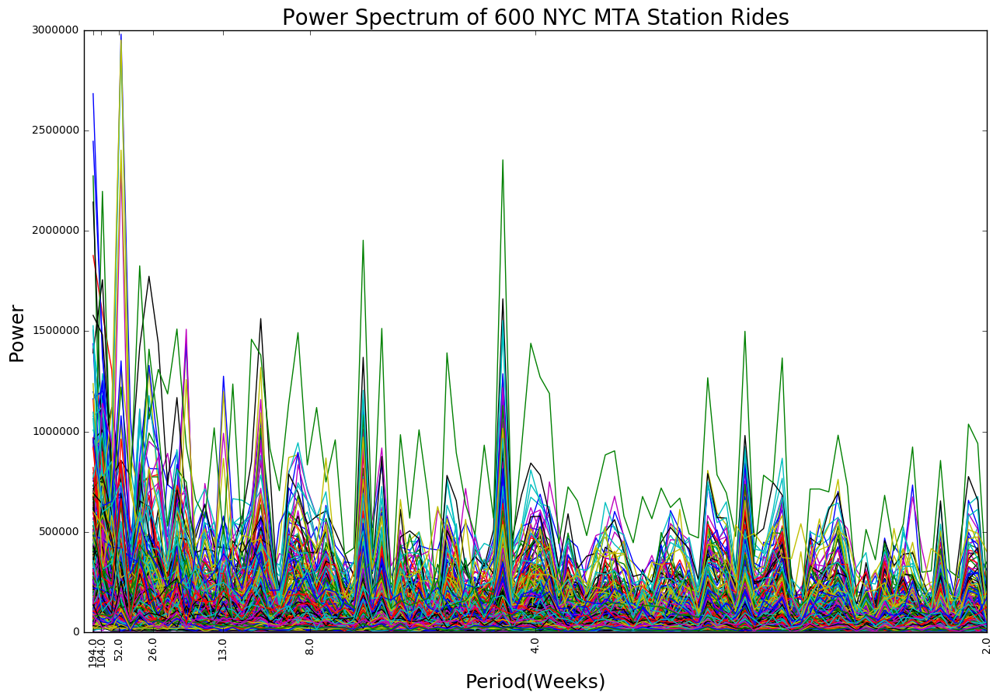

In [37]:
allperiods = [1./194, 1./104, 1./52, 1./26, 1./13, 1./8, 1./4, 1./2]

fig = pl.figure(figsize=(15,10))
ax = fig.add_subplot(111)
for i in range(len(card_sum)):
    f = np.abs(np.fft.rfft(card_sum[i]))
    ax.plot(np.fft.rfftfreq(len(ridesDate), 1.0)[1:], (f[1:]))
ax.set_xticks(allperiods)
ax.set_xticklabels([ "%s"%(1/f) for f in allperiods], rotation=90)
ax.set_xlabel('Period(Weeks)', fontsize=18)
ax.set_ylabel('Power', fontsize=18)
ax.set_title('Power Spectrum of 600 NYC MTA Station Rides', fontsize=20)

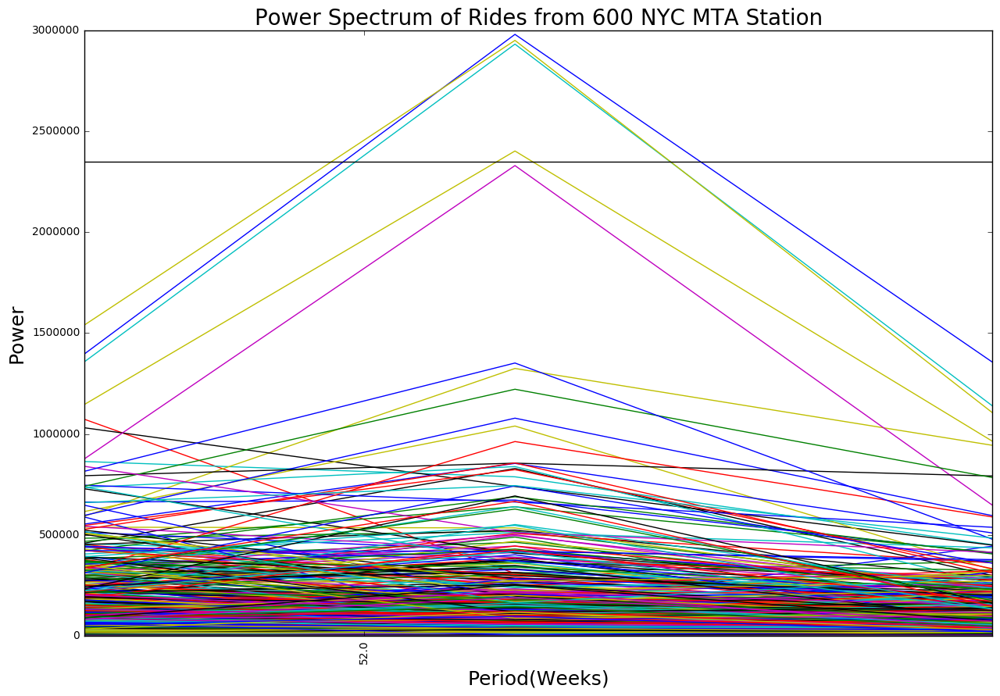

In [38]:
index = []
fig = pl.figure(figsize=(15,10))
ax = fig.add_subplot(111)
for i in range(len(card_sum)):
    f = np.abs(np.fft.rfft(card_sum[i]))
    ax.plot(np.fft.rfftfreq(len(ridesDate), 1.0)[1:], (f[1:]))
    if f[4] > 2.35e6:
        index.append(i)
ax.plot((1./60, 1./40), (2.35e6, 2.35e6), 'k-')
ax.set_xticks(allperiods)
ax.set_xticklabels([ "%s"%(1/x) for x in allperiods], rotation=90)
ax.set_xlim(1./60, 1./40)
ax.set_xlabel('Period(Weeks)', fontsize = 18)
ax.set_ylabel('Power', fontsize = 18)
ax.set_title('Power Spectrum of Rides from 600 NYC MTA Station', fontsize = 20)

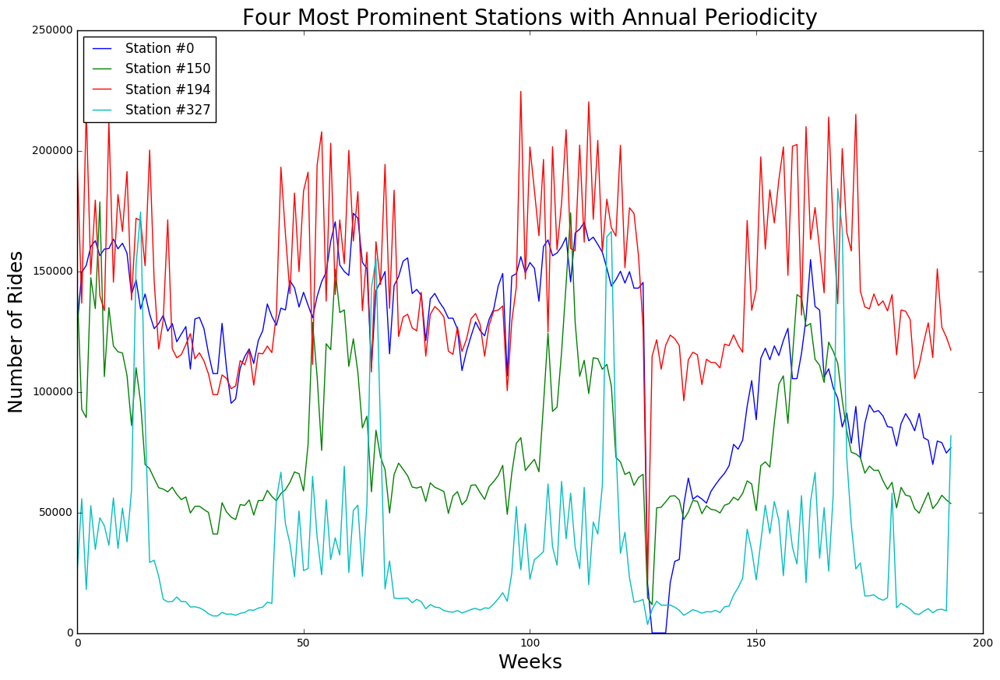

In [40]:
pl.figure(figsize=(15,10))
for i in index:
    pl.plot(card_sum[i], label='Station #%s'%i)
pl.xlabel('Weeks', fontsize=18)
pl.ylabel('Number of Rides', fontsize=18)
pl.title('Four Most Prominent Stations with Annual Periodicity', fontsize=20)
pl.legend(loc = 2)

## Four peaks above the horizonal line



## EXTRA CREDIT: Cluster. 
### Cluster the time series, i.e. identify groups of time series that look similar among each other. You can use KMeans for example to identify common trends, or PCA (Principle Component Analysis). 
### Since this is extra credit I will leave it to you to figure out the details, but for KMeans for e.g. if you use the sklearn.cluster package it would look something like:



In [43]:
total = timeseries.transpose(2,0,1).reshape(timeseries.shape[2], timeseries.shape[1]*timeseries.shape[0]).T

In [45]:
total = total[total.std(1)>0]

In [46]:
value = ((total.T - total.mean(1))/total.std(1)).T

In [47]:
from sklearn.cluster import KMeans

In [48]:
km = KMeans(n_clusters=6).fit(value)

In [49]:
cluster_label = km.predict(value)

In [51]:
from sklearn.decomposition import PCA
n = value.shape[1]
pca = PCA(n)
Xproj = pca.fit_transform(value)

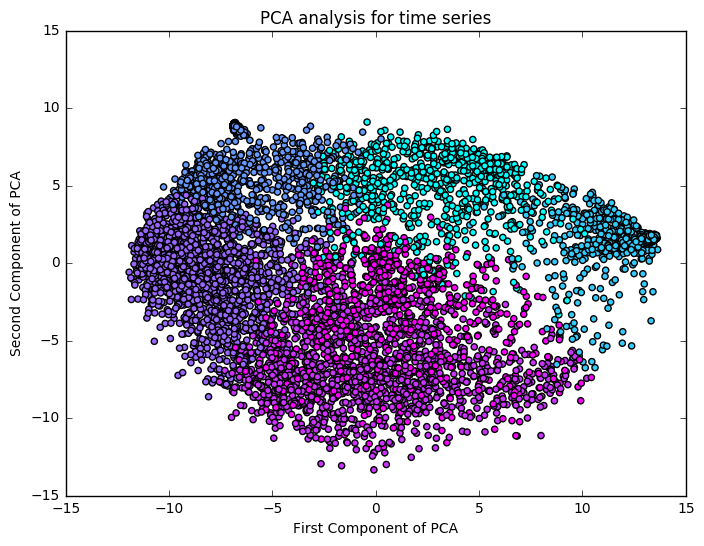

In [52]:
plt.figure(figsize=(8, 6))
plt.scatter(Xproj[:, 0], Xproj[:, 1], c=cluster_label, cmap=plt.cm.cool)
plt.xlabel('First Component of PCA')
plt.ylabel('Second Component of PCA')
plt.title("PCA analysis for time series")
plt.show()